# Neural Style

##TODO
convert this into command line script
*  input, two images
* optional diplay input/output and iteration plots
* other command line args for n_iteration ect
* option to square crop from center
* save output image

In [20]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import time
import functools
import os


import tensorflow as tf
import tensorflow.contrib.eager as tfe

from tensorflow.python.keras.preprocessing import image
from tensorflow.python.keras import models 
from tensorflow.python.keras import losses
from tensorflow.python.keras import layers
from tensorflow.python.keras import backend as K

tf.enable_eager_execution()
print("Eager execution: {}".format(tf.executing_eagerly()))


ValueError: ignored

In [0]:
def get_model():
  """ Creates our model with access to intermediate layers. 
  
  This function will load the VGG19 model and access the intermediate layers. 
  These layers will then be used to create a new model that will take input image
  and return the outputs from these intermediate layers from the VGG model. 
  
  Returns:
    returns a keras model that takes image inputs and outputs the style and 
      content intermediate layers. 
  """
  # Load our model. We load pretrained VGG, trained on imagenet data
  vgg = tf.keras.applications.vgg19.VGG19(include_top=False, weights='imagenet')
  vgg.trainable = False
  # Get output layers corresponding to style and content layers 
  style_outputs = [vgg.get_layer(name).output for name in style_layers]
  content_outputs = [vgg.get_layer(name).output for name in content_layers]
  model_outputs = style_outputs + content_outputs
  # Build model 
  return models.Model(vgg.input, model_outputs)

def get_content_loss(base_content, target):
  return tf.reduce_mean(tf.square(base_content - target))  


def gram_matrix(input_tensor):
  # We make the image channels first 
  channels = int(input_tensor.shape[-1])
  a = tf.reshape(input_tensor, [-1, channels])
  n = tf.shape(a)[0]
  gram = tf.matmul(a, a, transpose_a=True)
  return gram / tf.cast(n, tf.float32)

def get_style_loss(base_style, gram_target):
  """Expects two images of dimension h, w, c"""
  # height, width, num filters of each layer
  # We scale the loss at a given layer by the size of the feature map and the number of filters
  height, width, channels = base_style.get_shape().as_list()
  gram_style = gram_matrix(base_style)
  
  return tf.reduce_mean(tf.square(gram_style - gram_target))# / (4. * (channels ** 2) * (width * height) ** 2)

def get_feature_representations(model, content_path, style_path):
  """Helper function to compute our content and style feature representations.

  This function will simply load and preprocess both the content and style 
  images from their path. Then it will feed them through the network to obtain
  the outputs of the intermediate layers. 
  
  Arguments:
    model: The model that we are using.
    content_path: The path to the content image.
    style_path: The path to the style image
    
  Returns:
    returns the style features and the content features. 
  """
  # Load our images in 
  content_image = load_and_process_img(content_path)
  style_image = load_and_process_img(style_path)
  
  # batch compute content and style features
  stack_images = np.concatenate([style_image, content_image], axis=0)
  model_outputs = model(stack_images)
  
  # Get the style and content feature representations from our model  
  style_features = [style_layer[0] for style_layer in model_outputs[:num_style_layers]]
  content_features = [content_layer[1] for content_layer in model_outputs[num_style_layers:]]
  return style_features, content_features

def compute_loss(model, loss_weights, init_image, gram_style_features, content_features):
  """This function will compute the loss total loss.
  
  Arguments:
    model: The model that will give us access to the intermediate layers
    loss_weights: The weights of each contribution of each loss function. 
      (style weight, content weight, and total variation weight)
    init_image: Our initial base image. This image is what we are updating with 
      our optimization process. We apply the gradients wrt the loss we are 
      calculating to this image.
    gram_style_features: Precomputed gram matrices corresponding to the 
      defined style layers of interest.
    content_features: Precomputed outputs from defined content layers of 
      interest.
      
  Returns:
    returns the total loss, style loss, content loss, and total variational loss
  """
  style_weight, content_weight = loss_weights
  
  # Feed our init image through our model. This will give us the content and 
  # style representations at our desired layers. Since we're using eager
  # our model is callable just like any other function!
  model_outputs = model(init_image)
  
  style_output_features = model_outputs[:num_style_layers]
  content_output_features = model_outputs[num_style_layers:]
  
  style_score = 0
  content_score = 0

  # Accumulate style losses from all layers
  # Here, we equally weight each contribution of each loss layer
  weight_per_style_layer = 1.0 / float(num_style_layers)
  for target_style, comb_style in zip(gram_style_features, style_output_features):
    style_score += weight_per_style_layer * get_style_loss(comb_style[0], target_style)
    
  # Accumulate content losses from all layers 
  weight_per_content_layer = 1.0 / float(num_content_layers)
  for target_content, comb_content in zip(content_features, content_output_features):
    content_score += weight_per_content_layer* get_content_loss(comb_content[0], target_content)
  
  style_score *= style_weight
  content_score *= content_weight

  # Get total loss
  loss = style_score + content_score 
  return loss, style_score, content_score

def compute_grads(cfg):
  with tf.GradientTape() as tape: 
    all_loss = compute_loss(**cfg)
  # Compute gradients wrt input image
  total_loss = all_loss[0]
  return tape.gradient(total_loss, cfg['init_image']), all_loss

def run_style_transfer(content_path, 
                       style_path,
                       num_iterations=1000,
                       content_weight=1e3, 
                       style_weight=1e-2, 
                       show_best=True): 
  display_num = 100
  # We don't need to (or want to) train any layers of our model, so we set their
  # trainable to false. 
  model = get_model() 
  for layer in model.layers:
    layer.trainable = False
  
  # Get the style and content feature representations (from our specified intermediate layers) 
  style_features, content_features = get_feature_representations(model, content_path, style_path)
  gram_style_features = [gram_matrix(style_feature) for style_feature in style_features]
  
  # Set initial image
  init_image = load_and_process_img(content_path)
  init_image = tfe.Variable(init_image, dtype=tf.float32)
  # Create our optimizer
  opt = tf.train.AdamOptimizer(learning_rate=5, beta1=0.99, epsilon=1e-1)

  # For displaying intermediate images 
  iter_count = 1
  
  # Store our best result
  best_loss, best_img = float('inf'), None
  
  # Create a nice config 
  loss_weights = (style_weight, content_weight)
  cfg = {
      'model': model,
      'loss_weights': loss_weights,
      'init_image': init_image,
      'gram_style_features': gram_style_features,
      'content_features': content_features
  }
    
  # For displaying
  plt.figure(figsize=(14, 7))
  num_rows = (num_iterations / display_num) // 5
  start_time = time.time()
  global_start = time.time()
  
  norm_means = np.array([103.939, 116.779, 123.68])
  min_vals = -norm_means
  max_vals = 255 - norm_means   
  for i in range(num_iterations):
    grads, all_loss = compute_grads(cfg)
    loss, style_score, content_score = all_loss
    # grads, _ = tf.clip_by_global_norm(grads, 5.0)
    opt.apply_gradients([(grads, init_image)])
    clipped = tf.clip_by_value(init_image, min_vals, max_vals)
    init_image.assign(clipped)
    end_time = time.time() 
    
    if loss < best_loss:
      # Update best loss and best image from total loss. 
      best_loss = loss
      best_img = init_image.numpy()

    if i % display_num == 0:
      print('Iteration: {}'.format(i))        
      print('Total loss: {:.4e}, ' 
            'style loss: {:.4e}, '
            'content loss: {:.4e}, '
            'time: {:.4f}s'.format(loss, style_score, content_score, time.time() - start_time))
      start_time = time.time()
      
      # Display intermediate images
      if iter_count > num_rows * 5: continue 
      plt.subplot(num_rows, 5, iter_count)
      # Use the .numpy() method to get the concrete numpy array
      plot_img = init_image.numpy()
      plot_img = deprocess_img(plot_img)
      plt.imshow(plot_img)
      plt.title('Iteration {}'.format(i + 1))
      iter_count += 1
  print('Total time: {:.4f}s'.format(time.time() - global_start))
  if show_best:
    show_results(best_img, content_path, style_path, show_large_final=True)
  return best_img, best_loss 

def load_and_process_img(path_to_img):
  img = load_img(path_to_img)
  img = tf.keras.applications.vgg19.preprocess_input(img)
  return img

def deprocess_img(processed_img):
  x = processed_img.copy()
  if len(x.shape) == 4:
    x = x.reshape(img_shape)
  assert len(x.shape) == 3, ("Input to deprocess image must be an image of "
                             "dimension [batch, height, width, channel] or [height_width_channel]")
  if len(x.shape) != 3:
    raise ValueError("Invalid input to deprocessing image")
  
  # perform the inverse of the preprocessiing step
  x[:, :, 0] += 103.939
  x[:, :, 1] += 116.779
  x[:, :, 2] += 123.68
  x = x[:, :, ::-1]

  x = np.clip(x, 0, 255).astype('uint8')
  return x

def load_img(path_to_img):
  img = image.load_img(path_to_img, target_size=(img_shape[0], img_shape[1]))
  img = image.img_to_array(img)
  # We need to broadcast the image array such that it has a batch dimension 
  img = np.expand_dims(img, axis=0)
  return img

def imshow(img, title=None):
  # Remove the batch dimension
  out = np.squeeze(img, axis=0)
  # Normalize for display 
  out = out.astype('uint8')
  plt.imshow(out)
  if title is not None:
    plt.title(title)
  plt.imshow(out)
  
  plt.figure(figsize=(10,10))

def show_results(best_img, content_path, style_path, show_large_final=True, show_all=False):
  x = deprocess_img(best_img)

  if show_all:
    plt.figure(figsize=(15, 15))
    content = load_img(content_path) 
    style = load_img(style_path)
    plt.subplot(1, 3, 1)
    imshow(content, 'Content Image')

    plt.subplot(1, 3, 2)
    imshow(style, 'Style Image')

    plt.subplot(1, 3, 3)
    plt.imshow(x)
    plt.title('Output Image')
    plt.show()

  if show_large_final: 
    plt.figure(figsize=(10, 10))

    plt.imshow(x)
    plt.title('Output Image')
    plt.show()



## Define Images

Provide path to images

These are input content and style images. We hope to "create" an image with the content of our content image, but with the style of the style image. 

In [0]:
project_path = r'D:\Dropbox\projects\neural_style' # need r for windows

# Set up some global values here
img_shape = (512, 512, 3)
turtle_path = os.path.join(project_path, 'images', 'Green_Sea_Turtle_grazing_seagrass.jpg')
wave_path = os.path.join(project_path, 'images',  'The_Great_Wave_off_Kanagawa.jpg')

tuebingen_path = os.path.join(project_path, 'images', 'Tuebingen_Neckarfront.jpg')
starry_night_path = os.path.join(project_path, 'images',  '1024px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg')
space_path = os.path.join(project_path, 'images',  'Pillars_of_creation_2014_HST_WFC3-UVIS_full-res_denoised.jpg')
kandinsky_path = os.path.join(project_path, 'images',  'Vassily_Kandinsky,_1913_-_Composition_7.jpg')


## Example inputs

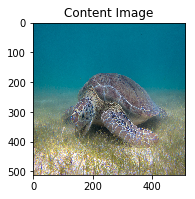

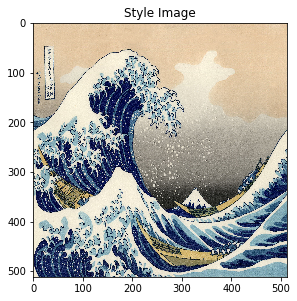

<Figure size 720x720 with 0 Axes>

In [7]:
content = load_img(turtle_path).astype('uint8')
style = load_img(wave_path)

plt.subplot(1, 2, 1)
imshow(content, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style, 'Style Image')
plt.show()


## Preprocess
These methods  will allow us to load and preprocess our images easily. We perform the same preprocessing process as are expected according to the VGG training process. VGG networks are trained on image with each channel normalized by `mean = [103.939, 116.779, 123.68]`and with channels BGR.

Since our optimized image may take its values anywhere between  −∞  and  ∞ , we must clip to maintain our values from within the 0-255 range.

#Model

In this case, we load VGG19, and feed in our input tensor to the model. This will allow us to extract the feature maps (and subsequently the content and style representations) of the content, style, and generated images.

We use VGG19, as suggested in the paper. In addition, since VGG19 is a relatively simple model (compared with ResNet, Inception, etc) the feature maps actually work better for style transfer.

These intermediate layers are necessary to define the representation of content and style from our images.

We’ll load our pretrained image classification network, grab the layers of interest , then we define a Model by setting the model’s inputs to an image and the outputs to the outputs of the style and content layers


## Loss
### Content Loss
Our content loss definition is actually quite simple. We’ll pass the network both the desired content image and our base input image. This will return the intermediate layer outputs (from the layers defined above) from our model. Then we simply take the euclidean distance between the two intermediate representations of those images.  

More formally, content loss is a function that describes the distance of content from our output image $x$ and our content image, $p$. Let $C_{nn}$ be a pre-trained deep convolutional neural network. Again, in this case we use [VGG19](https://keras.io/applications/#vgg19). Let $X$ be any image, then $C_{nn}(X)$ is the network fed by X. Let $F^l_{ij}(x) \in C_{nn}(x)$ and $P^l_{ij}(p) \in C_{nn}(p)$ describe the respective intermediate feature representation of the network with inputs $x$ and $p$ at layer $l$. Then we describe the content distance (loss) formally as: $$L^l_{content}(p, x) = \sum_{i, j} (F^l_{ij}(x) - P^l_{ij}(p))^2$$

We perform backpropagation in the usual way such that we minimize this content loss. We thus change the initial image until it generates a similar response in a certain layer (defined in content_layer) as the original content image.

We will actually add our content losses at each desired layer. This way, each iteration when we feed our input image through the model (which in eager is simply model(input_image)!) all the content losses through the model will be properly compute and because we are executing eagerly, all the gradients will be computed.

### Style Loss
Computing style loss is a bit more involved, but follows the same principle, this time feeding our network the base input image and the style image. However, instead of comparing the raw intermediate outputs of the base input image and the style image, we instead compare the Gram matrices of the two outputs. 

Mathematically, we describe the style loss of the base input image, $x$, and the style image, $a$, as the distance between the style representation (the gram matrices) of these images. We describe the style representation of an image as the correlation between different filter responses given by the Gram matrix  $G^l$, where $G^l_{ij}$ is the inner product between the vectorized feature map $i$ and $j$ in layer $l$. We can see that $G^l_{ij}$ generated over the feature map for a given image represents the correlation between feature maps $i$ and $j$. 

To generate a style for our base input image, we perform gradient descent from the content image to transform it into an image that matches the style representation of the original image. We do so by minimizing the mean squared distance between the feature correlation map of the style image and the input image. The contribution of each layer to the total style loss is described by
$$E_l = \frac{1}{4N_l^2M_l^2} \sum_{i,j}(G^l_{ij} - A^l_{ij})^2$$

where $G^l_{ij}$ and $A^l_{ij}$ are the respective style representation in layer $l$ of $x$ and $a$. $N_l$ describes the number of feature maps, each of size $M_l = height * width$. Thus, the total style loss across each layer is 
$$L_{style}(a, x) = \sum_{l \in L} w_l E_l$$
where we weight the contribution of each layer's loss by some factor $w_l$. In our case, we weight each layer equally ($w_l =\frac{1}{|L|}$)

### Get feature representation
We’ll define a little helper function that will load our content and style image, feed them forward through our network, which will then output the content and style feature representations from our model. 

## Computing the loss and gradients
Here we use [**tf.GradientTape**](https://www.tensorflow.org/programmers_guide/eager#computing_gradients) to compute the gradient. It allows us to take advantage of the automatic differentiation available by tracing operations for computing the gradient later. It records the operations during the forward pass and then is able to compute the gradient of our loss function with respect to our input image for the backwards pass.

## Set up

In [0]:
# Content layer where will pull our feature maps
content_layers = ['block5_conv2'] 

# Style layer we are interested in
style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1', 
                'block4_conv1', 
                'block5_conv1'
               ]

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)



In [0]:
turtle_path = os.path.join(project_path, 'images', 'Green_Sea_Turtle_grazing_seagrass.jpg')
wave_path = os.path.join(project_path, 'images',  'The_Great_Wave_off_Kanagawa.jpg')

house_path = os.path.join(project_path, 'images', 'Tuebingen_Neckarfront.jpg')
starry_night_path = os.path.join(project_path, 'images',  '1024px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg')
space_path = os.path.join(project_path, 'images',  'Pillars_of_creation_2014_HST_WFC3-UVIS_full-res_denoised.jpg')
kandinsky_path = os.path.join(project_path, 'images',  'Vassily_Kandinsky,_1913_-_Composition_7.jpg')

kendrick_path = os.path.join(project_path, 'images',  'kendrick.jpg')
japanese_path = os.path.join(project_path, 'images',  'japanese.png')
bjork_path = os.path.join(project_path, 'images',  'bjork.png')
beatles_path = os.path.join(project_path, 'images',  'beatles.png')


Iteration: 0
Total loss: 2.9634e+09, style loss: 2.9634e+09, content loss: 0.0000e+00, time: 0.0995s
Iteration: 100
Total loss: 4.3964e+07, style loss: 3.6610e+07, content loss: 7.3539e+06, time: 9.3116s
Iteration: 200
Total loss: 1.9361e+07, style loss: 1.2638e+07, content loss: 6.7228e+06, time: 9.2585s
Iteration: 300
Total loss: 1.1805e+07, style loss: 6.0495e+06, content loss: 5.7551e+06, time: 9.3112s
Iteration: 400
Total loss: 8.3465e+06, style loss: 3.5769e+06, content loss: 4.7696e+06, time: 9.2971s
Iteration: 500
Total loss: 6.5104e+06, style loss: 2.4681e+06, content loss: 4.0423e+06, time: 9.2900s
Iteration: 600
Total loss: 5.4580e+06, style loss: 1.9141e+06, content loss: 3.5439e+06, time: 9.4307s
Iteration: 700
Total loss: 4.7925e+06, style loss: 1.6094e+06, content loss: 3.1831e+06, time: 9.4921s
Iteration: 800
Total loss: 4.3339e+06, style loss: 1.4223e+06, content loss: 2.9117e+06, time: 9.3760s
Iteration: 900
Total loss: 3.9998e+06, style loss: 1.2931e+06, content loss

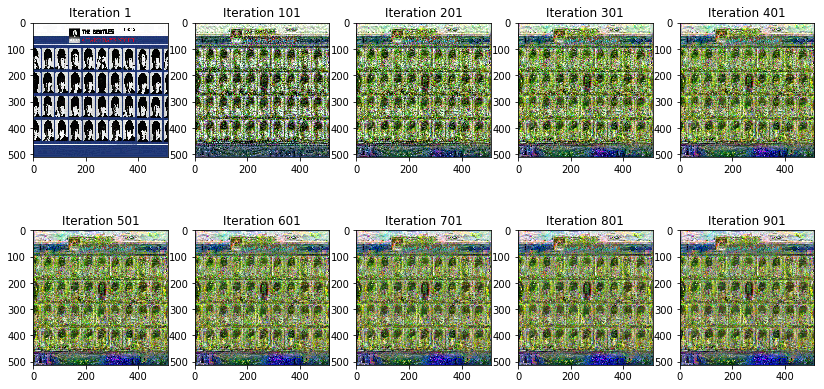

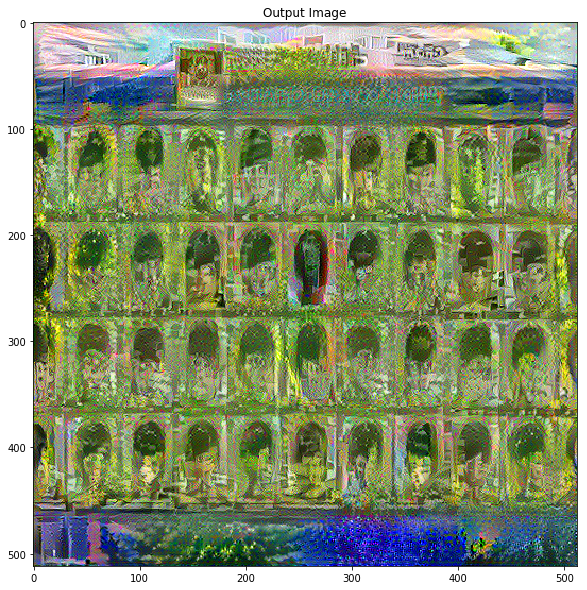

In [34]:
best_beatles_jap, best_loss = run_style_transfer(beatles_path, japanese_path)


Iteration: 0
Total loss: 9.7688e+08, style loss: 9.7688e+08, content loss: 0.0000e+00, time: 0.0960s
Iteration: 100
Total loss: 1.9708e+07, style loss: 1.7842e+07, content loss: 1.8656e+06, time: 9.3460s
Iteration: 200
Total loss: 7.8198e+06, style loss: 6.2846e+06, content loss: 1.5352e+06, time: 9.3606s
Iteration: 300
Total loss: 3.9389e+06, style loss: 2.7118e+06, content loss: 1.2270e+06, time: 9.3523s
Iteration: 400
Total loss: 2.5524e+06, style loss: 1.5506e+06, content loss: 1.0018e+06, time: 9.5344s
Iteration: 500
Total loss: 1.9319e+06, style loss: 1.0780e+06, content loss: 8.5391e+05, time: 9.4053s
Iteration: 600
Total loss: 1.5915e+06, style loss: 8.3348e+05, content loss: 7.5799e+05, time: 9.3717s
Iteration: 700
Total loss: 1.3804e+06, style loss: 6.9591e+05, content loss: 6.8447e+05, time: 9.3073s
Iteration: 800
Total loss: 1.2400e+06, style loss: 6.0859e+05, content loss: 6.3138e+05, time: 9.3596s
Iteration: 900
Total loss: 1.1405e+06, style loss: 5.4815e+05, content loss

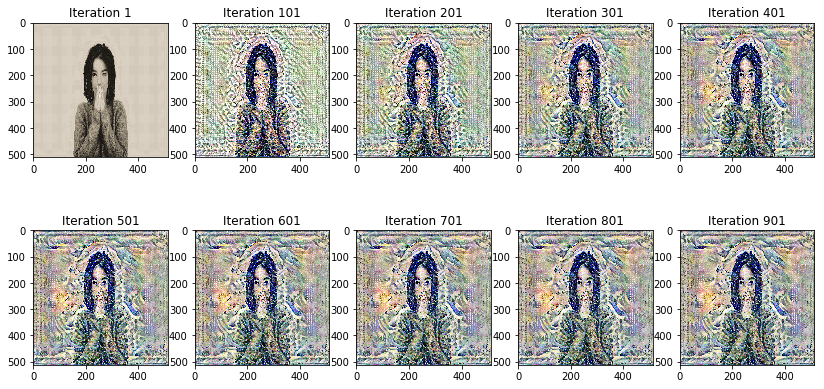

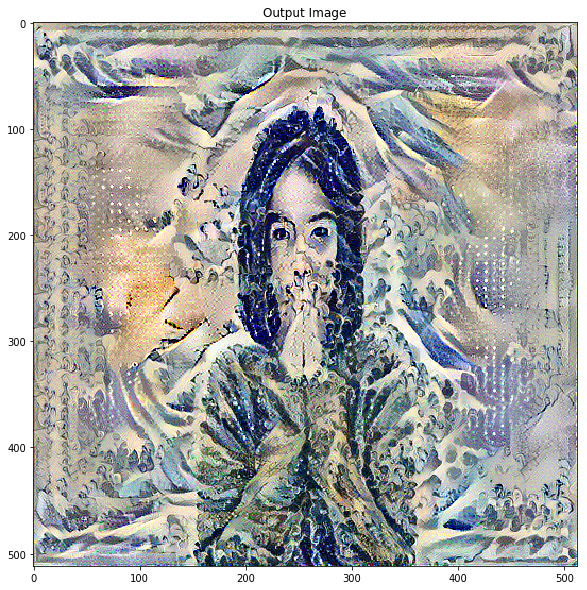

In [35]:
best_beatles_jap, best_loss = run_style_transfer(bjork_path, wave_path)


Iteration: 0
Total loss: 8.4229e+08, style loss: 8.4229e+08, content loss: 0.0000e+00, time: 0.0965s
Iteration: 100
Total loss: 2.0528e+07, style loss: 1.8846e+07, content loss: 1.6818e+06, time: 9.3376s
Iteration: 200
Total loss: 8.1459e+06, style loss: 6.6711e+06, content loss: 1.4749e+06, time: 9.4487s
Iteration: 300
Total loss: 4.3181e+06, style loss: 3.0560e+06, content loss: 1.2621e+06, time: 9.3535s
Iteration: 400
Total loss: 2.8654e+06, style loss: 1.7995e+06, content loss: 1.0659e+06, time: 9.3467s
Iteration: 500
Total loss: 2.1546e+06, style loss: 1.2421e+06, content loss: 9.1254e+05, time: 9.2893s
Iteration: 600
Total loss: 1.7662e+06, style loss: 9.5998e+05, content loss: 8.0617e+05, time: 9.4005s
Iteration: 700
Total loss: 1.5298e+06, style loss: 7.9464e+05, content loss: 7.3519e+05, time: 9.2479s
Iteration: 800
Total loss: 1.3739e+06, style loss: 6.9243e+05, content loss: 6.8146e+05, time: 9.1044s
Iteration: 900
Total loss: 1.2635e+06, style loss: 6.2259e+05, content loss

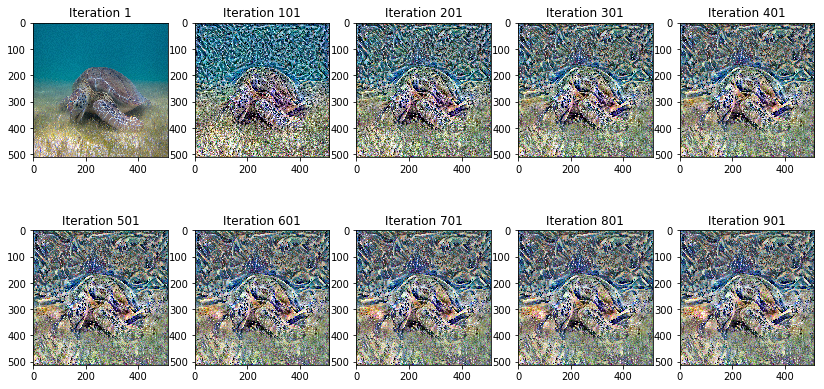

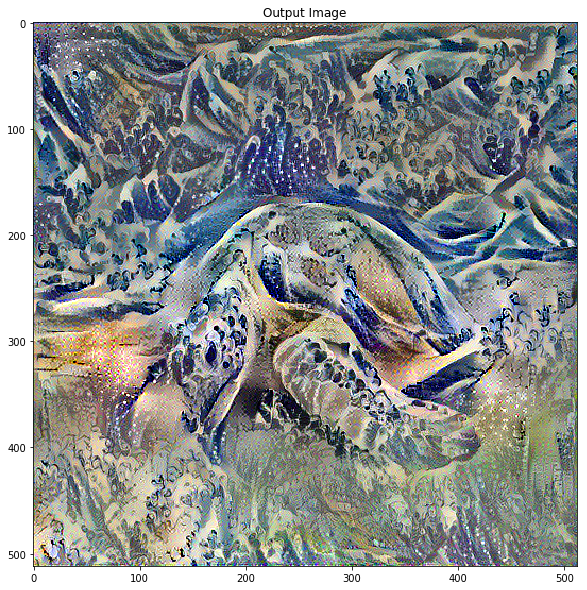

In [36]:
best_turtle_wave, best_loss = run_style_transfer(turtle_path, wave_path)


Iteration: 0
Total loss: 2.2597e+08, style loss: 2.2597e+08, content loss: 0.0000e+00, time: 0.1014s
Iteration: 100
Total loss: 4.8458e+06, style loss: 2.9842e+06, content loss: 1.8616e+06, time: 9.7036s
Iteration: 200
Total loss: 2.1999e+06, style loss: 9.6856e+05, content loss: 1.2313e+06, time: 9.7001s
Iteration: 300
Total loss: 1.3821e+06, style loss: 5.0124e+05, content loss: 8.8086e+05, time: 9.5316s
Iteration: 400
Total loss: 1.0349e+06, style loss: 3.4113e+05, content loss: 6.9381e+05, time: 9.5320s
Iteration: 500
Total loss: 8.5249e+05, style loss: 2.7129e+05, content loss: 5.8120e+05, time: 9.6720s
Iteration: 600
Total loss: 7.4208e+05, style loss: 2.3389e+05, content loss: 5.0819e+05, time: 9.7822s
Iteration: 700
Total loss: 6.7009e+05, style loss: 2.1305e+05, content loss: 4.5704e+05, time: 9.7069s
Iteration: 800
Total loss: 6.2026e+05, style loss: 1.9860e+05, content loss: 4.2166e+05, time: 9.5834s
Iteration: 900
Total loss: 5.8297e+05, style loss: 1.8865e+05, content loss

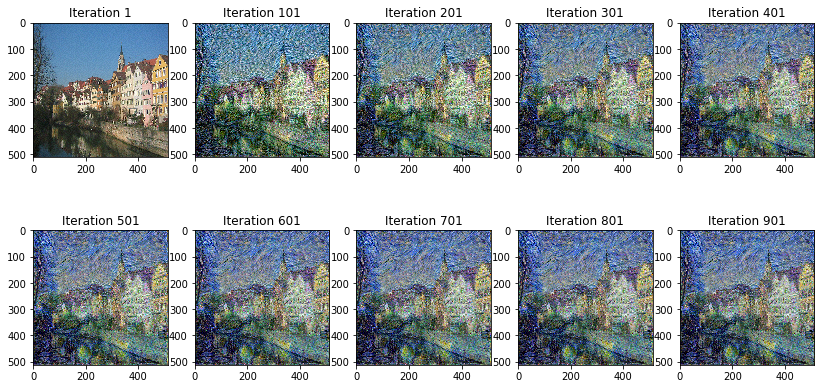

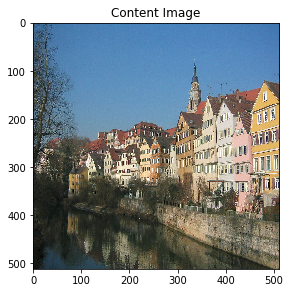

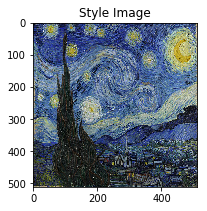

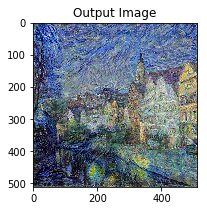

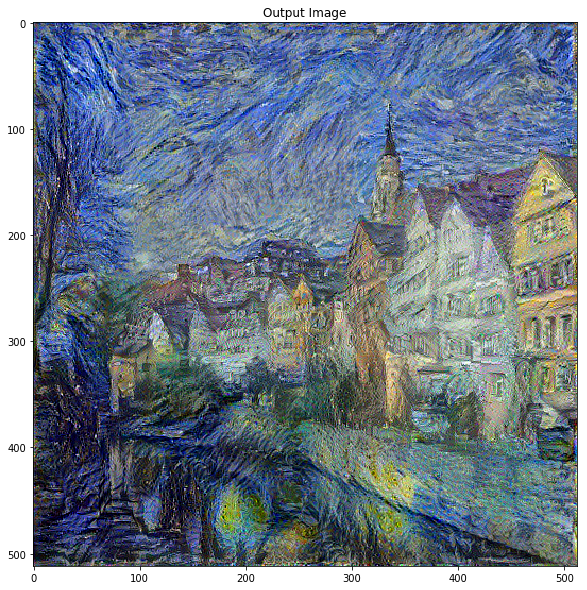

In [13]:
best_starry_night_tubingen, best_loss = run_style_transfer(tuebingen_path, starry_night_path)


Iteration: 0
Total loss: 1.8150e+08, style loss: 1.8150e+08, content loss: 0.0000e+00, time: 0.1005s
Iteration: 100
Total loss: 6.1481e+06, style loss: 4.0315e+06, content loss: 2.1166e+06, time: 9.7808s
Iteration: 200
Total loss: 2.7324e+06, style loss: 1.2798e+06, content loss: 1.4526e+06, time: 9.6229s
Iteration: 300
Total loss: 1.6255e+06, style loss: 5.8455e+05, content loss: 1.0410e+06, time: 9.5610s
Iteration: 400
Total loss: 1.1517e+06, style loss: 3.5193e+05, content loss: 7.9980e+05, time: 9.6780s
Iteration: 500
Total loss: 9.1645e+05, style loss: 2.6284e+05, content loss: 6.5361e+05, time: 9.6600s
Iteration: 600
Total loss: 7.8438e+05, style loss: 2.1995e+05, content loss: 5.6443e+05, time: 9.5892s
Iteration: 700
Total loss: 7.0414e+05, style loss: 1.9557e+05, content loss: 5.0857e+05, time: 9.7758s
Iteration: 800
Total loss: 6.5023e+05, style loss: 1.8180e+05, content loss: 4.6843e+05, time: 9.6085s
Iteration: 900
Total loss: 6.1281e+05, style loss: 1.7213e+05, content loss

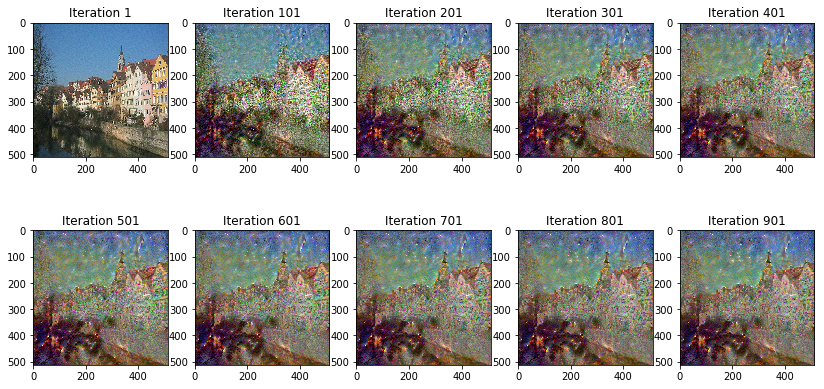

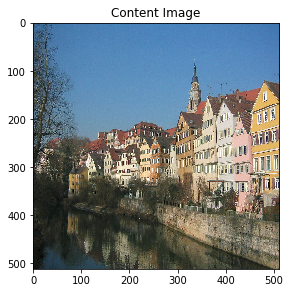

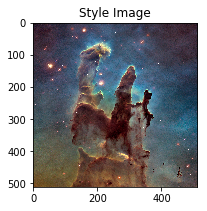

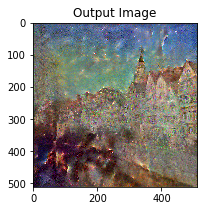

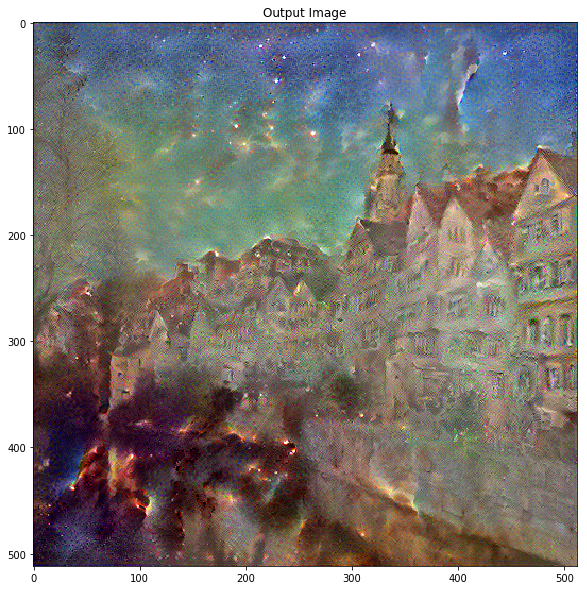

In [14]:
best_space_tubingen, best_loss = run_style_transfer(tuebingen_path, space_path)

Iteration: 0
Total loss: 8.1872e+08, style loss: 8.1872e+08, content loss: 0.0000e+00, time: 0.1010s
Iteration: 100
Total loss: 1.2470e+07, style loss: 9.3543e+06, content loss: 3.1160e+06, time: 9.8549s
Iteration: 200
Total loss: 5.4757e+06, style loss: 3.1276e+06, content loss: 2.3480e+06, time: 9.8536s
Iteration: 300
Total loss: 3.2764e+06, style loss: 1.4985e+06, content loss: 1.7779e+06, time: 9.6809s
Iteration: 400
Total loss: 2.3651e+06, style loss: 9.5887e+05, content loss: 1.4062e+06, time: 9.6288s
Iteration: 500
Total loss: 1.9014e+06, style loss: 7.3089e+05, content loss: 1.1705e+06, time: 9.7471s
Iteration: 600
Total loss: 1.6304e+06, style loss: 6.1227e+05, content loss: 1.0181e+06, time: 9.5203s
Iteration: 700
Total loss: 1.4531e+06, style loss: 5.3932e+05, content loss: 9.1374e+05, time: 9.5044s
Iteration: 800
Total loss: 1.3288e+06, style loss: 4.8962e+05, content loss: 8.3920e+05, time: 9.5314s
Iteration: 900
Total loss: 1.2374e+06, style loss: 4.5472e+05, content loss

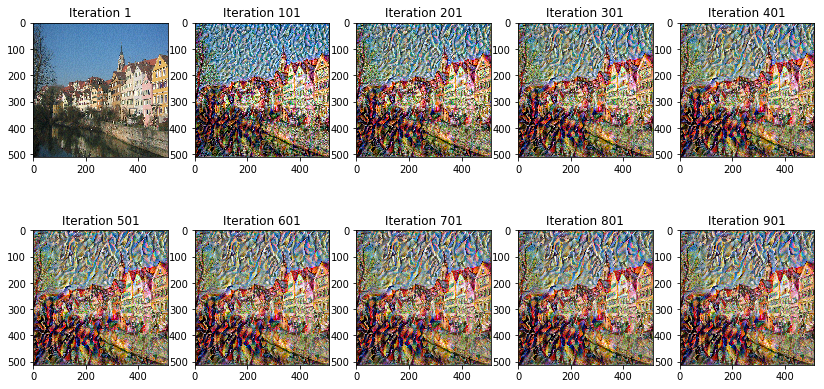

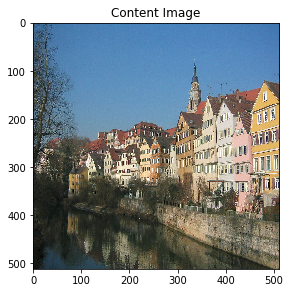

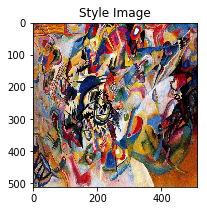

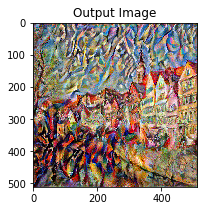

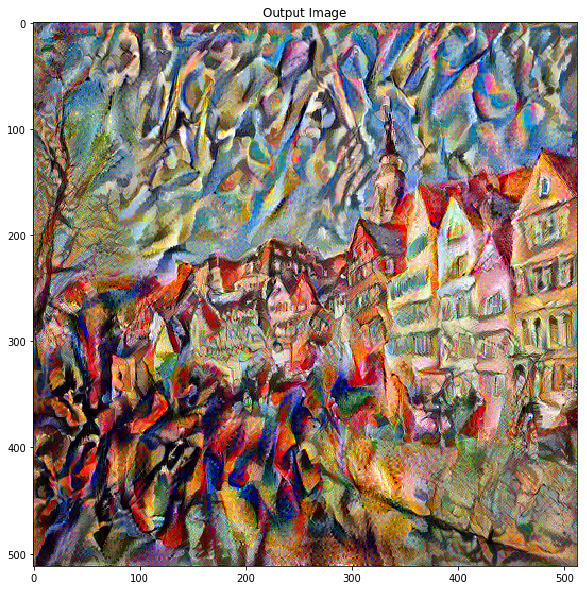

In [15]:
best_kandinsky_tubingen, best_loss = run_style_transfer(tuebingen_path, kandinsky_path)

Iteration: 0
Total loss: 6.2807e+07, style loss: 6.2807e+07, content loss: 0.0000e+00, time: 0.1015s
Iteration: 100
Total loss: 2.2133e+06, style loss: 1.5422e+06, content loss: 6.7116e+05, time: 9.4141s
Iteration: 200
Total loss: 9.6452e+05, style loss: 5.0644e+05, content loss: 4.5808e+05, time: 9.3898s
Iteration: 300
Total loss: 5.9127e+05, style loss: 2.6024e+05, content loss: 3.3102e+05, time: 9.2337s
Iteration: 400
Total loss: 4.3096e+05, style loss: 1.7218e+05, content loss: 2.5878e+05, time: 9.1458s
Iteration: 500
Total loss: 3.4867e+05, style loss: 1.3467e+05, content loss: 2.1399e+05, time: 9.2276s
Iteration: 600
Total loss: 3.0241e+05, style loss: 1.1528e+05, content loss: 1.8713e+05, time: 9.1503s
Iteration: 700
Total loss: 2.7372e+05, style loss: 1.0390e+05, content loss: 1.6982e+05, time: 9.2734s
Iteration: 800
Total loss: 2.5453e+05, style loss: 9.6386e+04, content loss: 1.5814e+05, time: 9.0909s
Iteration: 900
Total loss: 2.4089e+05, style loss: 9.1031e+04, content loss

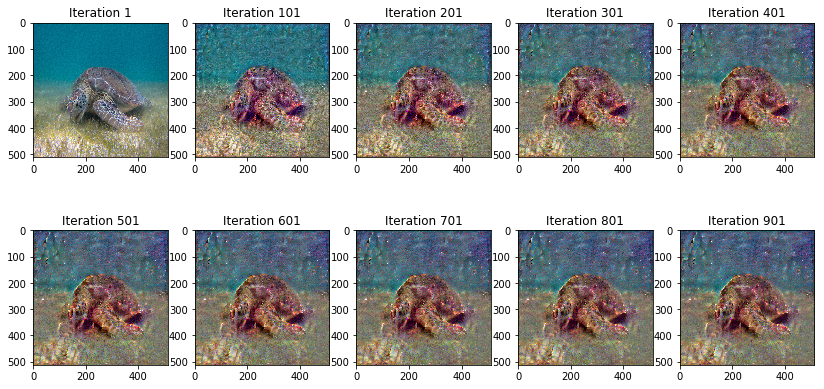

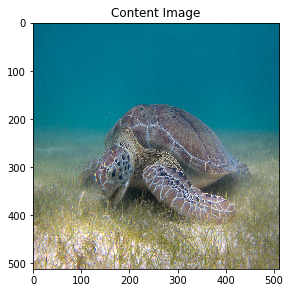

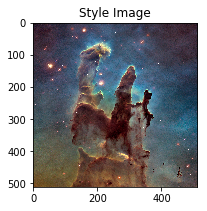

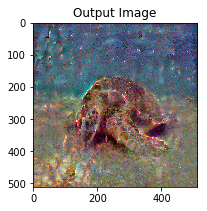

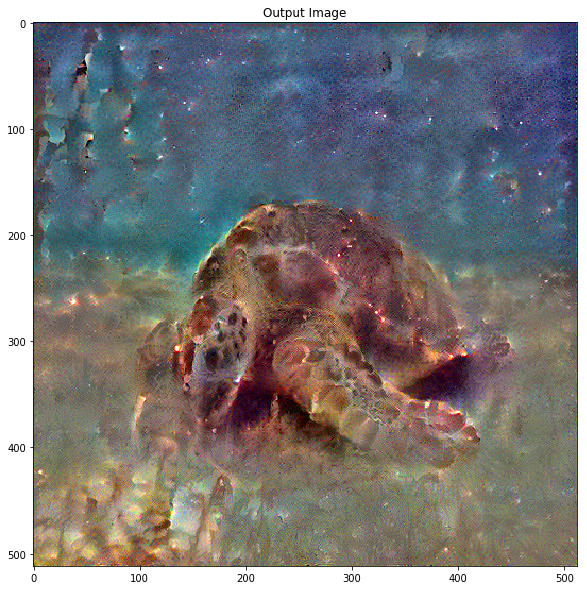

In [18]:
best_turtle_space, best_loss = run_style_transfer(turtle_path, space_path)